## **Section 1** Introduction (no tasks to complete)

In this programming assignment, you are going to use CNNs to build your own AI capable of piloting self-driving cars.  Your goal will be to build an AI that uses dashcam footage from cars and predict in real-time the turn direction a car should make.  After completing this assignment, you should be able to use both an algorithmic approach and a machine learning approach to estimate the turn direction.

<center>
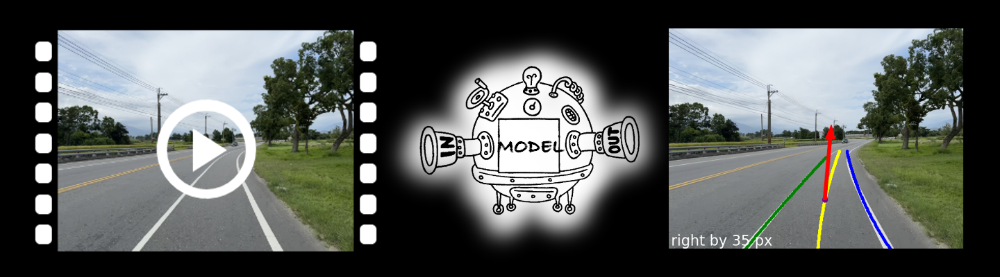
</center>

This assignment has three sections with tasks to complete.  Section 2 and Section 3 each has one main function (called `extract_xxx()`) split into several smaller functions (called `get_xxx()`).  You will need to fill in the code for these functions.  The overview of each section is as follows:

<b>Section 2</b>  Extracting lane markings

<center>
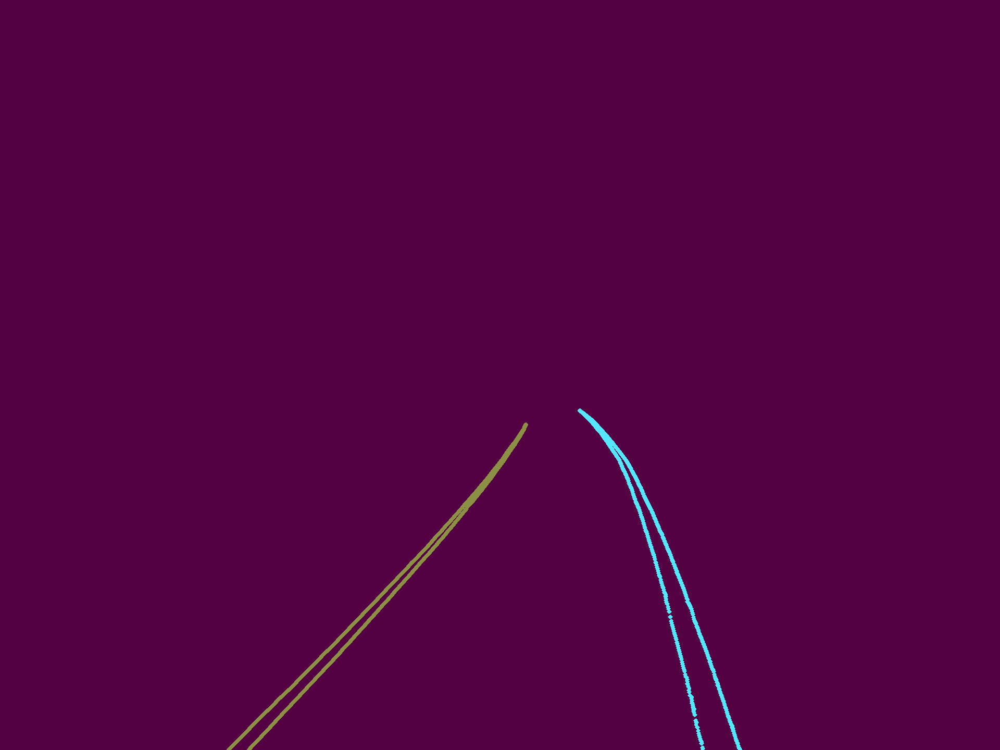
</center>

In section 2, you will write a function that detects the **edges** of the left and right lane markings on the road.  Here, “lane markings” refers to the white strips guiding the rider on the road.  The pseudocode of the function is as follows:


```python
def extract_lane_edges(img):
	get_bright_pixels() # TODO: road markings are usually bright in color
	get_lane_beginnings() # TODO: locate the beginning of the lane markings at the bottom of the image
	get_lane_whole() # TODO: locate the whole lane markings
	get_lane_edges() # TODO: use convolution kernels to detect the edges of the lane markings
	return lane_edges
```

<b>Section 3</b>  Estimating road curvature and turn direction

<center>
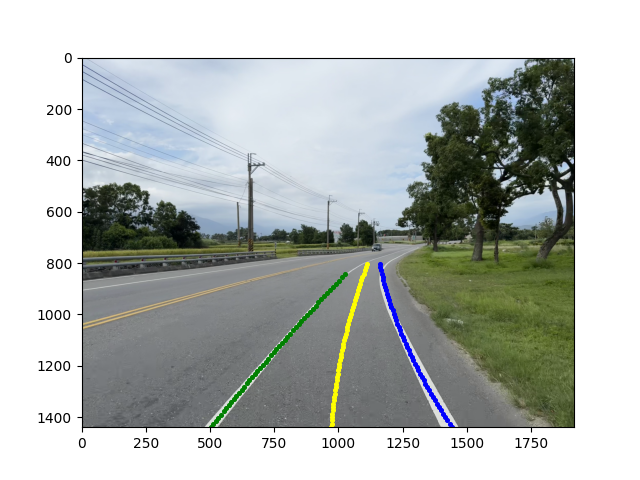
</center>

In section 3, you will use the results from section 2 to fit a quadratic polynomial to the left and right lane markings.  Using the fitted quadratic and some math, information on the turn direction can be extracted.  Code for the portions involving heavier math and tedious library operations is written for you, so you don't actually have to do any math.  The pseudo-code of the main function for this section is as follows:

```python
def extract_direction_vector(lane_edges):
	get_quadratic_fit() # TODO: fits quadratic polynomials to the lane markings
	get_middle_quadratic() # an extra step just to handle tedious operations for you
	get_curvature_and_direction() # use math to derive turn direction and sharpness of the turn
	get_direction_vector() # use math to derive a direction vector the rider should move in
	return direction_vector
```

In addition, one function to help you visualize your results and assist you in debugging is given:

```python
show_polynomials_and_vector()
```

<b>Section 4</b>  Building CNN models

In section 4, you will reshape the dataset into an appropriate format for the model, and train a CNN model for prediction.  This section contains 3 functions:

```python
 video_to_np()
 format_dataset()        # TODO
 get_model()             # TODO
```

Please be reminded that:

- You cannot import additional libraries.
- The lines of code used are for reference only.
-	Refer to the course webpage for the grading scheme of each task.
-	You can download the videos and images from the course website.
-	You can assume that when we test your code, the videos used will not
contain a lot of complicated road conditions such as intersections and traffic jams.  The road markings ahead will also generally be clearly visible.  Basically, we will NOT intentionally trip you up using severely out-of-sample testing data.
-	Generally, you should not need to define your own helper functions, but you are still allowed to do so if needed.  However make sure they do not slow down your code too much, or you may lose points in the last 2 test cases for efficiency.
-	You don't need to vectorize every function, but if your code takes too long to run, you may lose points in the last 2 test cases for efficiency. Therefore, we recommend you try your best to optimize your code!
-	<font color="red"><b>(IMPORTANT!)</b></font> Remember to remove all print statements and debugging code before your final submission.  


To get started, run the code cell below to import all necessary libraries.
When you are writing your code, be sure to make good use of `cv.imread()` and `plt.imshow()` to visualize your intermediate results.

In [ ]:
# import libraries.  This contains all the libraries you will need to complete this PA.
import numpy as np
import cv2 as cv
from keras import models
from keras import layers
from sklearn.model_selection import train_test_split
import os

# not used for any graded tasks.  Only for you to debug and visualize.
import matplotlib.pyplot as plt # plot images

In [ ]:
# connect your Google drive to load the videos and images
if __name__ == "__main__":
  from google.colab import drive
  drive.mount('/content/drive')

Mounted at /content/drive


## **Section 2** Extracting lane markings (5 tasks to complete)

##### Task 2.1:  `get_bright_pixels`

To estimate the turn direction, we first need to extract the lane markings from the road.

<center>
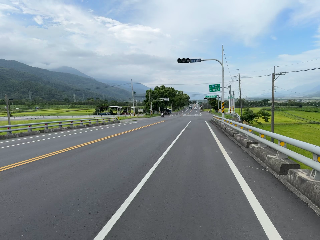
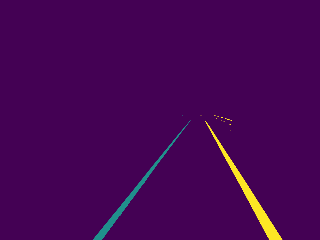
</center>

Since lane markings usually are marked in bright colors, we will start by extracting the <b>bright pixels</b> from the image.  For simplicity, we will take bright pixels to mean those pixels where the <b>red, green and blue intensities are all strictly greater than 175</b>.  Complete the following function which takes in an RGB image, and returns a boolean NumPy array where `True` indicates the location of these bright pixels.

<center>

| function name | parameter name | parameter datatype | return type
|---------------------------------|------------------------------------------|----------------------------|-------------------------------|
| `get_bright_pixels` <br> | `img` | `np.ndarray`, shape (height, width, 3)|  `np.ndarray`, shape (height, width) |            |

</center>

As an example, for an image with RGB intensities given as follows,

<center>
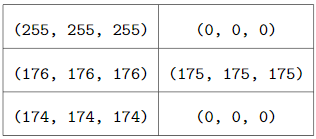
</center>

the returned result may be

<center>

| function call | content |
|---------------|--------------|
| `get_bright_pixels(img)`      | `[[True False]` <br> ` ` `[True False]` <br> ` ` `[False False]]` |

</center>

In [ ]:
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#
#-# TASK 2.1:  get_bright_pixels 	#-#
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#

def get_bright_pixels(img):
  """
  Finds the location of bright pixels in an image.
  Args:
    img: a NumPy array of shape (height, width, 3) storing an image
  Returns:
    A boolean NumPy array of shape (height, width) where True indicates the location of bright pixels.
  """
  ### TODO: Your code goes here! ###

  return None

##### Task 2.2:  `get_lane_beginnings`

Not all bright pixels represent lane markings.  Some bright pixels may wrongly correspond to the clouds or white-colored cars.  Next, we will try to refine our boolean NumPy array so that those unrelated pixels are set to `False`.  To do this, we first need to find out where the lane markings start.  We do this by following the algorithm detailed below.  The intuition of the algorithm is if we <b>only look at a small bottom strip</b> of the image, and count the number of bright pixels for each x-coordinate, we should get a graph as follows:

<center>
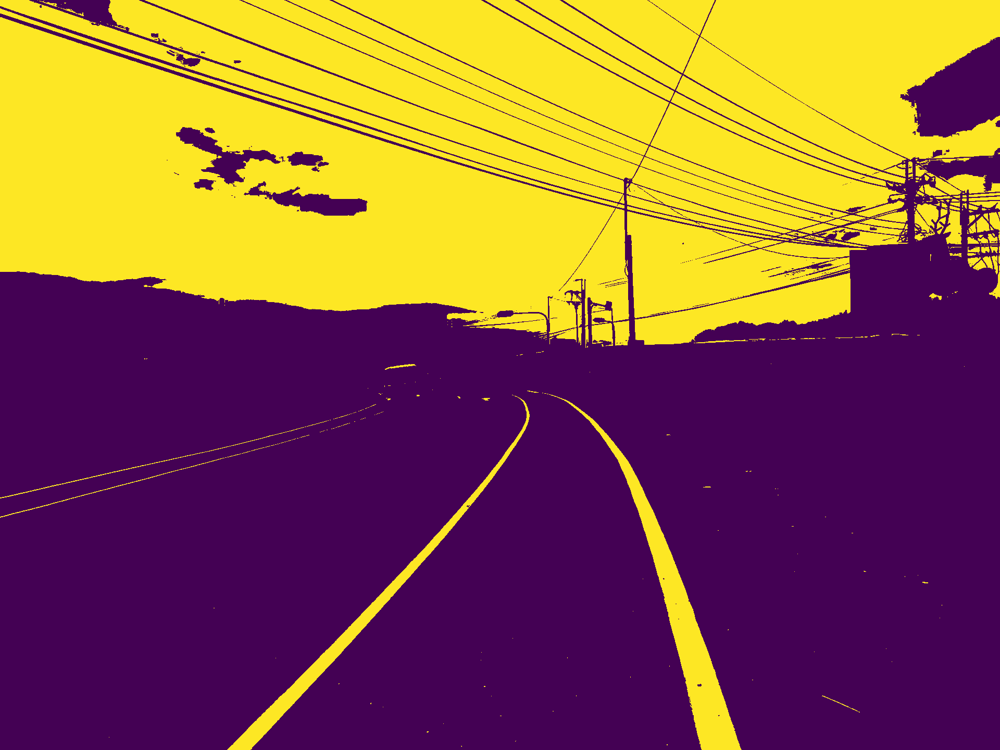
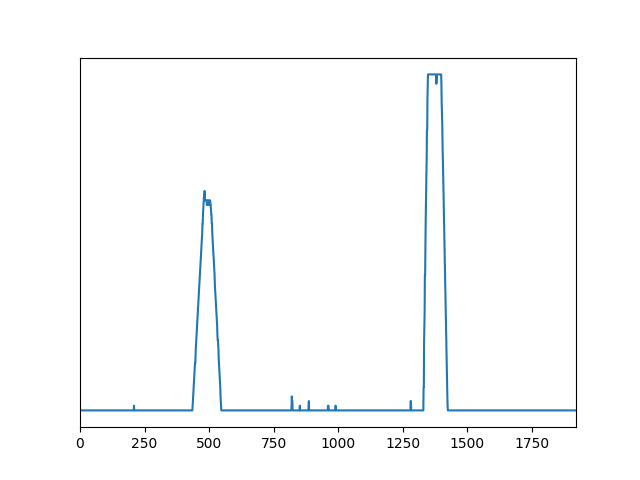
</center>

The x-coordinates of the two "peaks" of the graph would then correspond to the x-coordinates of the start of the lanes.  After you understand the intuition, follow the details below to complete the function `get_lane_beginnings()`.

1. For <i>each</i> x-coordinate value, count the total number of bright pixels in the <b>bottom 5%</b> of the x-th column of the image.  The bottom 5% means those pixels with a y-coordinate greater than or equal to `int(0.95*height)`, assuming the pixel at the top-left corner is the origin coordinate.  This step should produce the histogram shown above.
2. Calculate the one-third of the maximum value in the histogram.
3. Get the x-coordinates of all points on the histogram with a count <b>strictly</b> greater than the threshold in Step 2.  This should give you the x-coordinates of the "tall points" of the histogram.
4. Take the mean of all those x-coordinates found in Step 3.  This should give you an x-coordinate that approximately splits the left and right peaks.
5. Split the x-coordinates <b>found in Step 3</b> into two bunches: the left bunch with x-coordinate <b>strictly</b> less than Step 4, and the right bunch with x-coordinate <b>strictly</b> greater than Step 4.  This corresponds to the left peak and right peak.  We don't care about the value at the x-coordinate same as Step 4.
6. Return the median of the left bunch and the median of the right bunch, <b>casting the median to integers using</b> `int(...)`.

<center>

| function name | parameter name | parameter datatype | return type
|---------------------------------|------------------------------------------|----------------------------|-------------------------------|
| `get_lane_beginnings` <br> | `mask` | `np.ndarray`, shape (height, width) | `tuple(int, int)` |            |

</center>

As an example, assuming the <b>bottom 5%</b> of a mask is as follows,

<center>
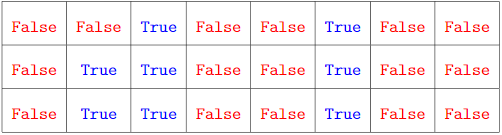
</center>

the returned result may be

<center>

| function call | content |
|---------------|--------------|
| `get_lane_beginnings(mask)`      | `(1, 5)` |

</center>

In [ ]:
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#
#-# TASK 2.2:  get_lane_beginnings 	#-#
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#

def get_lane_beginnings(mask):
  """
  Estimates the x-coordinates of the lane beginnings.
  Args:
    mask: a boolean NumPy array of shape (height, width) where True indicates the location of bright pixels.
  Returns:
    A tuple of two integers, containing the estimated x-coordinate of the beginning of the left and right lane respectively.
  """
  ### TODO: Your code goes here! ###

  return None

##### Task 2.3:  `get_whole_lanes`

With the lane beginnings now found, the next step is to iteratively search small areas above to trace out the lane markings.  Based on the lane beginnings found in step 2, we will draw bounding boxes (the red and green boxes shown below) that trace out the lane markings. Those bright pixels inside the red and green boxes would then correspond to the lane markings.

<center>
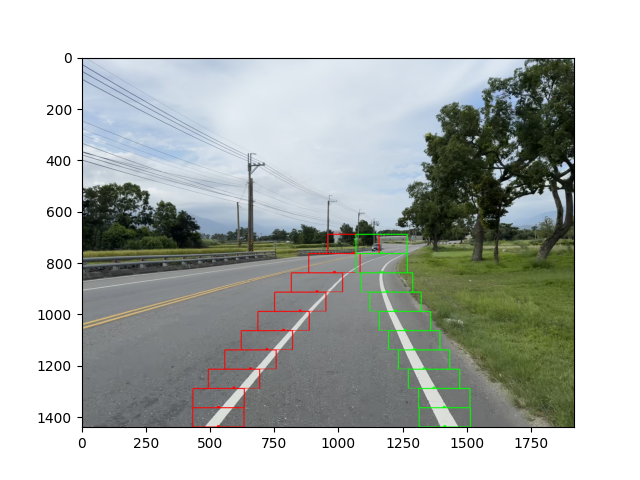
</center>

Follow the algorithm below to complete the function `get_whole_lanes()`.  If needed, feel free to define helper functions.

1. Start with y = height, x = left lane's beginning.  Consider the bounding box with y-coordinates [y-72, y) and x-coordinates [x-110, x+110).  Take the average x-coordinate of all of the <b>bright</b> pixels in the bounding box.  Recall that the parameter `mask` is a boolean NumPy array where `True` denotes bright pixels. (You may assume there will be no index out-of-bound issue with the bounding box)
2. Replace y with y-72, and x with the result found in Step 1 <b>cast to integer using </b>`int(...)`.  Reconstruct another bounding box following the same rules as Step 1, i.e. y-coordinates [y-72, y) and x-coordinates [x-110, x+110).  Again, take the average x-coordinate of the <b>bright</b> pixels in the new bounding box.
3. Replace the values of y and x again and continue repeating the procedure 7 more times.  In other words, in total, you should have considered 9 different bounding boxes. *Note: the sample image shown above uses 10 bounding boxes.  You should use 9 only.*
4. However, during the iteration, if you found that there is no bright pixel in the bounding box, you should break the iteration, since you will unable to calculate the starting x-coordinate of the next bounding box. In other words, it is possible that less than 9 bounding boxes are considered.
5. Repeat Steps 1-4, but this time with x = right lane's beginning.
6. Return a tuple of 2 boolean NumPy arrays, each with shape (height, width).  The first NumPy array should contain True <b>only</b> if that location is a bright pixel <b>and</b> belongs to one of the bounding boxes constructed from the left lane's beginnings.  Similarly, the second NumPy array should contain True <b>only</b> if that location is a bright pixel <b>and</b> belongs to one of the bounding boxes constructed from the right lane's beginnings.


<center>

| function name | parameter name | parameter datatype | return type
|---------------------------------|------------------------------------------|----------------------------|-------------------------------|
| `get_whole_lanes` <br> | `mask`<br> `left_lane`<br> `right_lane` | `np.ndarray`, shape (height, width)<br> `int`<br> `int` | `tuple(np.ndarray, np.ndarray)`<br> each array of shape (height, width) |

</center>

As an example, a visualization of the returned result may look as follows.  

<center>
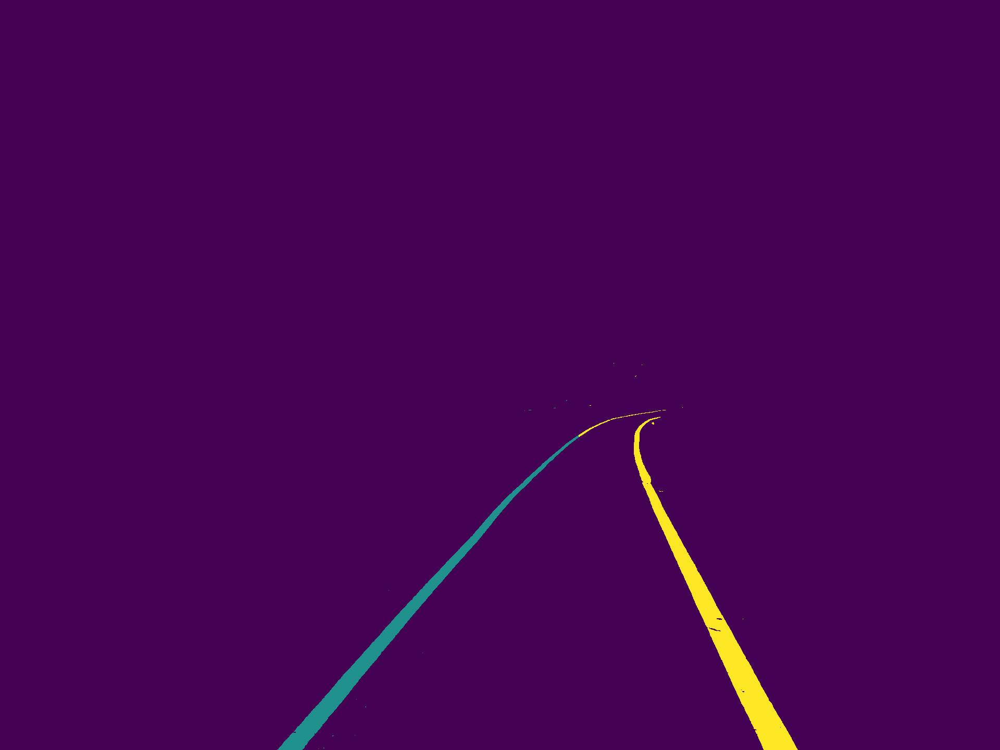
</center>

Here, blue represents those `True` values in `get_whole_lanes(...)[0]`, and yellow represents those `True` values in `get_whole_lanes(...)[1]`.  As you can see, we have filtered out the bright pixels unrelated to the road markings.

In [ ]:
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#
#-# TASK 2.3:  get_whole_lanes 	#-#
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#

def get_whole_lanes(mask, left_lane, right_lane):
  """
  Uses the beginning of the lanes to refine the mask so that those unrelated bright pixels are filtered out.
  Args:
    mask: a NumPy array of shape (height, width) where True indicates the bright pixels
    left_lane: the x-coordinate of the beginning of the left lane
    right_lane: the x-coordinate of the beginning of the right lane
  Returns:
    A tuple of 2 boolean NumPy arrays, each array with shape (height, width), corresponding to the left lane and right lane.
  """
  ### TODO: Your code goes here! ###

  return None

##### Task 2.4:  `get_lane_edges`

Finally, extract the <b>edges</b> of each of the left and right lanes.  This step is necessary to ensure the fitted quadratic polynomial in section 2 is not biased towards the bottom of the image, and also ensures a cleaner fit.  Follow the algorithm below to complete the function `get_lane_edges()`.

1. Apply 3 iterations of erosion to the boolean array containing the left lane.  Use the function `cv.erode()`, and structuring element as provided for you in the code.  You may need to type cast `left_lane` and `right_lane` by calling `xxx_lane.astype(np.uint8)`.
2. Apply 10 iterations of closing to the result of step 1, using the same structuring element.  Use the function `cv.morphologyEx()`.
3. Apply convolution to detect the left and right edges from the results of step 2, by making use of the left and right edge detection kernel given. Use the function `cv.filter2D()`, and perform the convolution operation using each kernel <b>once</b> only.  Remember that you are trying to detect the left and right edges, so do not apply the second filter to the result of the first filter.
4. Repeat steps 1-3, this time using the right lane instead of the left lane.
5. Return a tuple of two boolean NumPy arrays, where `True` indicates the locations of the left lane edges and right lane edges respectively. <b>Here, we say that a pixel is an edge only if the resultant pixel value has a value of 1 after all the steps above.</b>

Notes:
<ul>
<li> You can pass the provided structuring elements and edge detection kernels to the OpenCV functions directly. There is no need for you to flip them. </li>
<li> When applying multiple iterations with morphology operations, do <i>not</i> call the morphology multiple times naively. </li>
<li> Hint: You may refer to P.84 - P.98 of your <i>digital image processing fundamentals</i> notes, and OpenCV's documentation, on how to use those OpenCV functions. </li>
</ul>


<center>

| function name | parameter name | parameter datatype | return type
|---------------------------------|------------------------------------------|----------------------------|-------------------------------|
| `get_lane_edges()` <br> | `left_lane`<br> `right_lane` | `np.ndarray`, shape (height, width)<br> `np.ndarray`, shape (height, width) | `tuple(np.ndarray, np.ndarray)`<br> each array of shape (height, width) |

</center>

As an example, an <b>exaggerated</b> visualization of the returned result may look as follows.

<center>
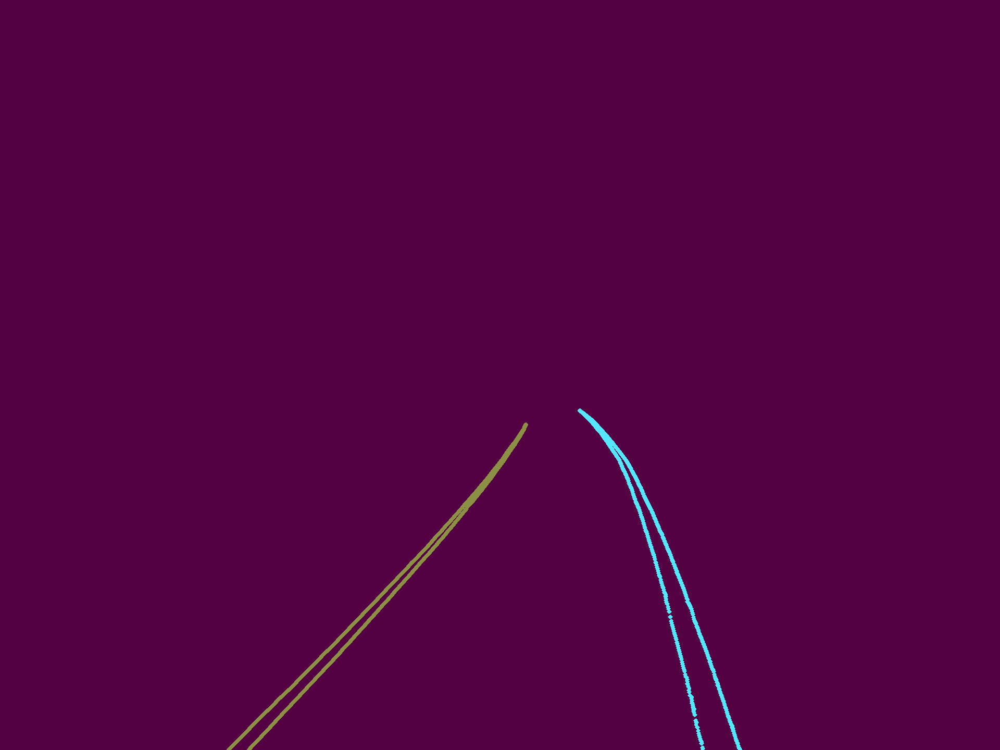
</center>

The edges of the left lane are in yellow, and the edges of the right lane are in blue.  The yellow and blue lines are thickened for visualization purposes.

In [ ]:
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#
#-# TASK 2.4:  get_lane_edges 	#-#
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#

def get_lane_edges(left_lane, right_lane):
  """
  Extracts lane edges.
  Args:
    left_lane: a boolean NumPy array of shape (height, width) where True indicates the pixels for the left lane
    right_lane: a boolean NumPy array of shape (height, width) where True indicates the pixels for the right lane
  Returns:
    A tuple of 2 boolean NumPy arrays each with shape (height, width), containing the edges of the left lane and the right lane respectively
  """
  # define the kernels
  edge_left_kernel = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])      # use this for left edge detection
  edge_right_kernel = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])     # use this for right edge detection
  structuring_element = np.array([[0, 1, 0], [1, 1, 1], [0, 1, 0]], dtype=np.uint8) # use this for erosion and closing

  ### TODO: Your code goes here! ###

  return None

##### Task 2.5:  `extract_lane_edges`

Use the 4 functions above to complete the function `extract_lane_edges()`, which takes in an RGB image and returns a tuple of 2 boolean NumPy arrays containing the edges of the left lane and right lane respectively.

<center>

| function name | parameter name | parameter datatype | return type
|---------------------------------|------------------------------------------|----------------------------|-------------------------------|
| `extract_lane_edges` <br> | `img` | `np.ndarray`, shape (height, width, 3) | `tuple(np.ndarray, np.ndarray)`<br> each array of shape (height, width) |

</center>

In [ ]:
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#
#-# TASK 2.5:  extract_lane_edges 	#-#
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#

def extract_lane_edges(img):
  """
  The main function of section 1.  Extracts the lane edges from an image.
  Args:
    img: a NumPy array of shape (height, width, 3) storing an image
  Returns:
    A tuple of 2 boolean NumPy arrays each with shape (height, width), containing the edges of the left lane and the right lane respectively
  """
  ### TODO: Your code goes here! ###

  return None

## **Section 3** Estimating road curvature and turn direction (2 tasks to complete)

##### Task 3.1:  `get_quadratic_fit`


In this section, we will use the edges detected from section 2 to derive the curvature and turn direction.  We will do this by first finding a "best-fit" quadratic polynomial through the edges detected in section 2.  Ideally, we would like to find a quadratic polynomial that passes neatly through the lane markings.  Fortunately, NumPy has a function that fits polynomials for us, but simply calling the function directly will not work well.  This is because, for tighter left and right turns, <b>the lane markings may not be a function of the x-axis</b>.  As you can see from the image below, one x-value corresponds to two y-values, so it is impossible to fit a quadratic function this way.  

<center>
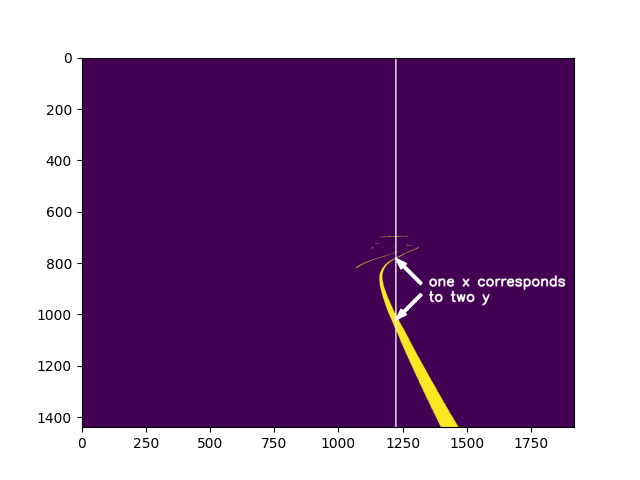
</center>

One workaround is to <b>flip our axes</b> so that the image y-axis now becomes our x-axis, as shown below:

<center>
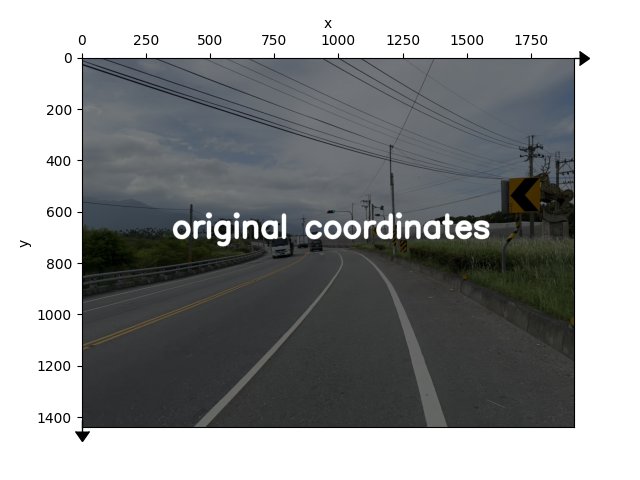
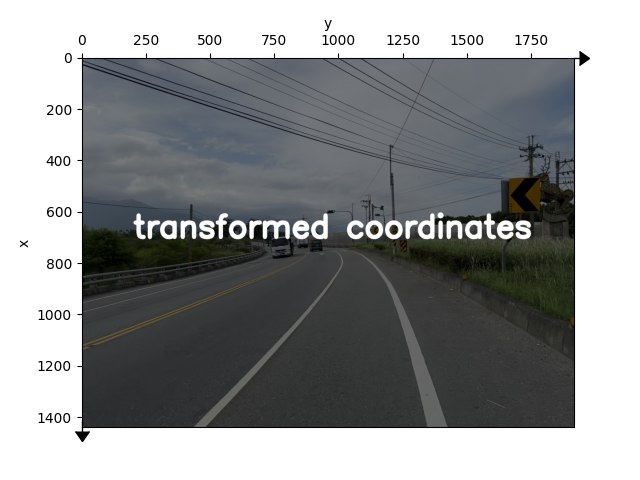
</center>

Now, the lane markings are a function of the transformed x-axis.  Use the hints to complete the function `get_quadratic_fit()` that fits one quadratic to the left lane edges, and one quadratic to the right lane edges.

<center>

| function name | parameter name | parameter datatype | return type
|---------------------------------|------------------------------------------|----------------------------|-------------------------------|
| `get_quadratic_fit` <br> | `left_lane_edge`<br> `right_lane_edge` | `np.ndarray`, shape (height, width)<br> `np.ndarray`, shape (height, width) | A tuple of two NumPy polynomials |

</center>

As an example, for `left_lane_edges` as follows,

<center>
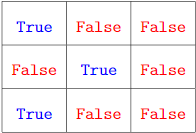
</center>

the fitted quadratic $p$ should satisfy $p(0)=0$, $p(1)=1$ and $p(2)=0$.  

<center>

| function call | content |
|---------------|--------------|
| `p, q = get_quadratic_fit(left_lane_edge, ...)` <br> `p(0), p(1), p(2)`     | `(0, 1, 0)` *(approximately)* |

</center>

Note that there will be slight rounding issues, you can safely ignore them.  Also, due to the way NumPy handles the domain of polynomials, printing the polynomial will not give $2x-x^2$ as you would expect.  However since those three points uniquely determine a quadratic, you can check your fit by calling `p(0), p(1), p(2)` as written above.

In [ ]:
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#
#-# TASK 3.1:  get_quadratic_fit 	#-#
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#

def get_quadratic_fit(left_lane_edge, right_lane_edge):
  """
  Fits a quadratic to the left lane and right lane using the edges of the lane markings.
  Args:
    left_lane-edge: a boolean NumPy array of shape (height, width) where True indicates the pixels for the left lane edges
    right_lane_edge: a boolean NumPy array of shape (height, width) where True indicates the pixels for the right lane edges
  Returns:
    a tuple containing two quadratics.
    return_val[0] is the fitted left quadratic, and return_val[2] is the fitted right quadratic
  """
  ### TODO: Your code goes here! ###

  # Hint: generate an appropriate coordinate grid
  grid = ???

  # Hint: use NumPy slicing and indexing to pass the correct coordinates of edges to fit the polynomial
  left_poly = np.polynomial.polynomial.Polynomial.fit(x=???, y=???, deg=2)
  right_poly = np.polynomial.polynomial.Polynomial.fit(x=???, y=???, deg=2)

  return left_poly, right_poly

#####  Completed for you:  `get_middle_quadratic`

After fitting the left and right polynomial, we will use the average of these two polynomials (yellow as shown below) to find the curvature and turn direction.  However due to the way NumPy handles polynomials, you cannot simply add the two polynomials and divide by 2 to find the middle polynomial.  Since this involves minor issues that are not too important, this part has been completed for you.

<center>
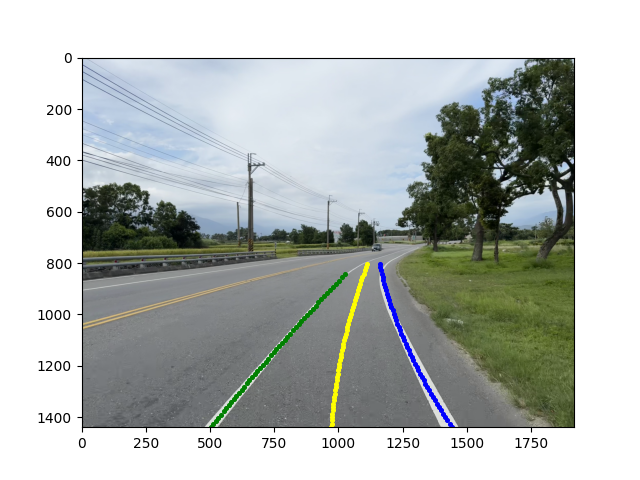
</center>

In [ ]:
# No tasks to complete here.

def get_middle_quadratic(left_poly, right_poly):
  """ Returns the average of the left and right polynomial """
  # average left and right quadratic, and handle NumPy domain issues
  middle_poly = (left_poly.convert(domain=[0, 1439]) + right_poly.convert(domain=[0, 1439])) / 2
  a, b, c, d = left_poly.domain[0], right_poly.domain[0], left_poly.domain[1], right_poly.domain[1]
  middle_poly = middle_poly.convert(domain=[min(a, b, c, d), max(a, b, c, d)])
  return middle_poly

##### Completed for you:  `get_curvature_and_direction`

Next, we will use the middle quadratic to estimate the curvature and turn direction.  The function make use of the following formulas, and return a tuple containing the curvature and the strings "left" or "right".  To find the derivative, it uses the NumPy function `poly.deriv(...)` instead of differentiating using the coefficients.  Since this course is called COMP2211 but not MATH2211, this part has also been completed for you.

$$
\begin{align*}
\text{Curvature at a point }x &= \frac{|p''(x)|}{(1+p'(x)^2)^{\frac{3}{2}}} \\
\text{Turn direction at a point }x &= \begin{cases}
      \texttt{left} & \text{ if } p''(x) \leq 0 \\
      \texttt{right} & \text{ if } p''(x) > 0
   \end{cases}
\end{align*}
$$

<center>

| function name | parameter name | parameter datatype | return type
|---------------------------------|------------------------------------------|----------------------------|-------------------------------|
| `get_curvature_and_direction` <br> | `poly` | A NumPy polynomial | `tuple(float, str)` |

</center>

As an example, for the polynomial `p` passed in the example of `get_curvature_and_direction()`, the returned result may be

<center>

| function call | content |
|---------------|--------------|
| `get_curvature_and_direction(p)` | `(2, "left")` *(approximately)* |

</center>

In [ ]:
# No tasks to complete here.
def get_curvature_and_direction(poly):
  """
  Estimates the curvature and turn direction from the averaged (middle) polynomial
  Args:
    poly: the middle polynomial
  Returns:
    A tuple containing the curvature and the strings "left" or "right"
  """
  # evalute the curvature and turn direction at this point
  pt = poly.domain.mean()

  # k(poly)(x) computes the curvature of a polynomial 'poly' at the point 'x', using the formula curvature = |p''| / (1+(p')^2)^1.5
  k = lambda poly: lambda x: np.abs(poly.deriv(m=2)(x)) / ((1 + poly.deriv(m=1)(x) ** 2) ** 1.5)

  # positive second derivative => turn right, negative second derivative => turn left
  twice_deriv = poly.deriv(m=2)(pt)
  direction = "right" if twice_deriv > 0 else "left"

  return k(poly)(pt), direction

##### Completed for you:  `get_direction_vector`

Next, we will use the curvature and direction to find the direction vector the car must move in, as shown below:

<center>
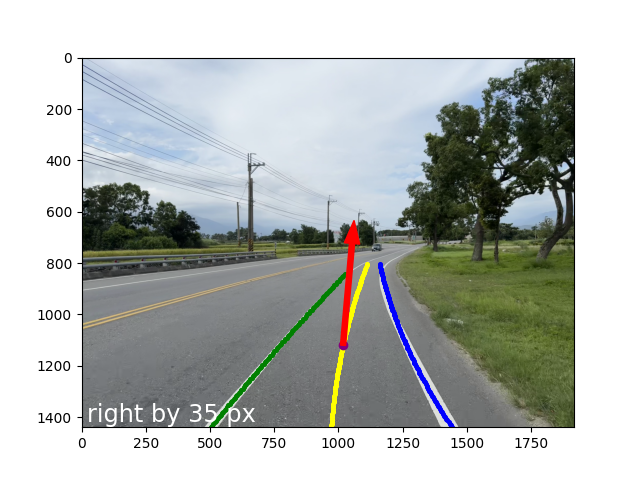
</center>

As you can expect, more math is about to appear.  Luckily, we have done the math for you, so you only need to understand the main idea.

<center>
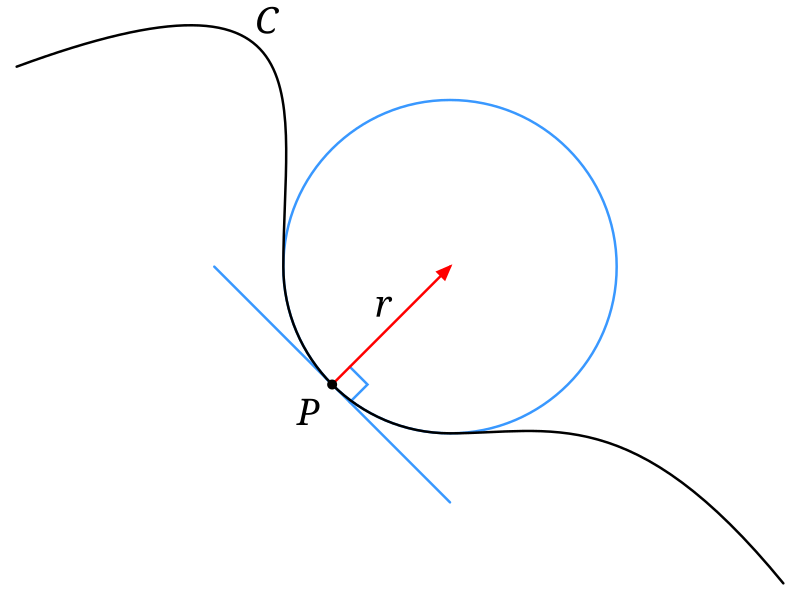
</center>

The <b>curvature</b> gives us information about <b>radius</b> of the tangent circle.  As you can imagine, the smaller the radius of the tangent circle, the tighter of a turn the car must make.  If you have taken at least high-school level physics, you may recognize this as the *centripetal acceleration* a car must maintain to make a turn.  Therefore, all this function does is find this tangent circle, and use basic polar coordinates to find the direction to move in.

The function returns two floats `dx` and `dy`, which gives the x and y components of the red direction vector.  For a left-turn (right-turn) road, `dx` would be negative (positive).  `dy` gives us the y-component of the red direction arrow, but for the purposes of this assignment you can ignore `dy`.

In [ ]:
# No tasks to complete here.

def get_direction_vector(curv, direction):
  """ Finds the direction vector to move in """
  r = 1 / curv # find radius of tangent circle
  s = 350 # move 350 pixels along the tangent circle
  if (direction == "left"):
    dx = - r + r * np.cos(s/r)
    dy = - r * np.sin(s/r)
  elif (direction == "right"):
    dx = + r - r * np.cos(s/r)
    dy = - r * np.sin(s/r)
  return dx, dy

##### Task 3.2:  `extract_direction_vector`

Finally, use the 4 functions above and `extract_lane_edges()` from section 1 to complete the function `extract_direction_vector()`, which takes in an RGB image and returns a tuple containing `dx` and `dy` from the direction vector.

<center>

| function name | parameter name | parameter datatype | return type
|---------------------------------|------------------------------------------|----------------------------|-------------------------------|
| `extract_direction_vector` <br> | `img` | `np.ndarray`, shape (height, width, 3) | `tuple(float, float)` |

</center>

In [ ]:
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#
#-# TASK 3.2:  extract_direction_vector #-#
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#

def extract_direction_vector(img):
  """
  Finds how much to move in the x and y direction.
  Args:
    img: a NumPy array of shape (height, width, 3) storing an image
  Returns:
    a tuple containing 2 floating point numbers.  The first one is dx, the second one is dy.
  """
  ### TODO: Your code goes here! ###

  return None

##### Visualization functions to help debugging

To help you debug, the following function `show_polynomials_and_vector()` will help you draw the polynomial you fitted in task 3.1 and the direction vector onto the image.

In [ ]:
# Helper function.  No tasks to complete here.

def show_polynomials_and_vector(img):
  """
  Plots polynomials and the direction vector onto the image.
  """
  h, _, _ = img.shape

  left_poly, right_poly = get_quadratic_fit(*extract_lane_edges(img))
  middle_poly = get_middle_quadratic(left_poly, right_poly)

  dx, dy = extract_direction_vector(img)
  direction = "left" if dx < 0 else "right"

  # get the points to evaluate the curvature at
  pt = middle_poly.domain.mean()

  # get the xy coordinates of the polynomial at various points
  left_y, left_x = left_poly.linspace(n=50)
  middle_y, middle_x = middle_poly.linspace(n=50)
  right_y, right_x = right_poly.linspace(n=50)

  # load image into matplotlib
  plt.imshow(img)

  # plot polynomial points on top of the image
  plt.scatter(x=left_x, y=left_y, color='green', s=7) # plot left poly
  plt.scatter(x=middle_x, y=middle_y, color='yellow', s=7) # plot middle poly
  plt.scatter(x=right_x, y=right_y, color='blue', s=7) # plot right poly
  plt.scatter(x=[middle_poly(pt)], y=[pt], color='purple') # plot point to evaluate curvature at
  plt.arrow(x=middle_poly(pt), y=pt, dx=dx, dy=dy, width=20, color=(1, 0, 0)) # draw direction vector
  plt.text(x=20, y=h-20, s=f"{direction} by {np.abs(dx)} px", fontsize='xx-large', color='white')

  plt.show()

if __name__ == '__main__':
  # Put the given img.png in your Colab files.
  # Your output should be the exactly same as the one below.
  if os.path.exists('img.png'):
    img = cv.imread('img.png')
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    show_polynomials_and_vector(img)
  else:
    print("\"img.png\" not found in Colab files!")


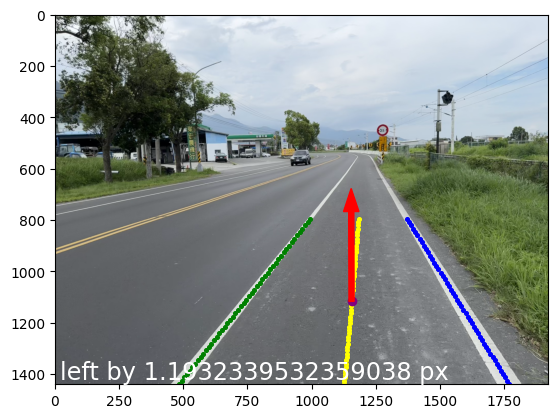

## **Section 4** Building CNN models (3 tasks to complete)

##### Completed for you:  `video_to_np`

Since our goal is to use videos to train a model, we will need a function to read a video into a NumPy array.  This function, `video_to_np`, is written for you already.  After you pass the filename (as a string) to the function, it will:

1. read every 30th frame from the video, which corresponds to one frame every second (the videos provided to you are recorded at 30 fps)
2. call `extract_direction_vector()` from section 3 and save down `dx`
3. convert the image to grayscale
4. blacken the top part of the image

The function returns you a tuple containing two NumPy arrays.  The first one stores every 30th frame (after steps 3 and 4), so it will have shape `(num_frames, height, width, 1)`.  The second one stores the `dx` values corresponding to each frame in the first NumPy array, so it has shape `(num_frames,)`.

In [ ]:
# No tasks to complete here.

def video_to_np(filename):
  """
  Pass in the filename (a string), returns a tuple containing the frames and the dx values for those frames
  Usage example: x, y = video_to_np("drive/MyDrive/video1.MOV")
  """
  cap = cv.VideoCapture(filename)
  counter = 0
  x = [] # stores the frames
  y = [] # stores the dx's
  while (cap.isOpened()):
    ret, frame = cap.read() # 'ret' is a boolean, where True signifies the frame is read successfully. 'frame' is a NumPy array of the image.
    # break if reached end of video
    if (not ret):
      break
    # only consider every 30th frame
    if (counter % 30 == 0):
      # try to extract dx (it may not work if the video contains frames with unclear or non-existing road markings, don't worry about this)
      try:
        dx, _ = extract_direction_vector(cv.cvtColor(frame, cv.COLOR_BGR2RGB))
        y.append(dx)
      except Exception as e:
        # print(f"Error in frame {counter}:", e)
        y.append(y[-1] if len(y) > 0 else 0)
      frame = cv.resize(frame, (320, 240)) # reduce resolution of image.  cv.resize uses (width, height)
      frame = np.expand_dims(cv.cvtColor(frame, cv.COLOR_RGB2GRAY), axis=2)  # change to grayscale and reshape to (height, width, 1)
      frame[:120] = 0 # change the upper half of the image to black
      x.append(frame)
    # increment frame number counter
    counter += 1

  return np.array(x), np.array(y)

##### Task 4.1:  `format_dataset`

When driving, it is natural to assume that we should not need to make sudden turns in direction, so footage from a few seconds ago should theoretically help us predict in which direction we should move now.  Since we have videos, we want to build our model <b>capable of using previous knowledge</b> to make a prediction now.  The simplest way to do this is by using <b>3D convolutional layers</b>.  With 2D convolution, you slide a 2D kernel across the axes "width" and "height".  With 3D convolution, you are able to slide a 3D kernel over the axes "time", "width" and "height".

However, training using videos requires a lot of GPU resources, time and training data.  To keep this assignment manageable, we will simplify our CNN's output: instead of asking it to predict a direction vector, we only need it to predict the direction to move in (left, straight or right).  So if the `dx` value is close enough to 0, we treat it as straight.

The first step is to format our dataset to incorporate this "previous information".  Complete the function `format_dataset()` which takes in a list of strings representing the filenames, and returns a tuple of 2 NumPy arrays.

- The first NumPy array is of shape `(num_sample, 5, height, width, 1)`.  It contains the frames from the videos, formatted such that every 5 consecutive seconds of footage are packed together.
- The second NumPy array is of shape `(num_sample,)`, and contains the `dx` value of the last frame of the group of 5 consecutive frames, mapped under the following rule:
  - 0 if `dx < -10`, which means a left turn
  - 1 if `-10 <= dx <= 10`, which means going straight
  - 2 if `dx > 10`, which means a right turn

Some skeleton code is given to help you, but you can delete them and write the function in any way you wish to.  Note that the parameter `video_to_np` exists so that we can test your code in a way that <b>your mistakes from sections 1 and 2 will not carry over</b>.  You don't need to worry about this parameter.

<center>

| function name | parameter name | parameter datatype | return type
|---------------------------------|------------------------------------------|----------------------------|-------------------------------|
| `format_dataset` <br> | `filenames`<br> `video_to_np` | `list[str]`<br>`function` | `tuple(np.ndarray, np.ndarray)`, <br> shape `(num_sample, 5, height, width, 1)` and `(num_sample,)` |

</center>

As an example, if the file

- "video1.MOV" has every 30th frame as `[A, B, C, D, E, F, G, H]` with `dx` values `[-20, -20, -20, -20, -20, -5, -5, 20]`, and
- "video2.MOV" has every 30th frame as `[a, b, c, d, e, f]` with `dx` values `[20, 20, -5, -5, -5, -20]`,

then the output results may be

<center>

| function call | return shape |
|---------------|--------------|
| `filenames = ["video1.MOV", "video2.MOV"]` <br>`x, y = format_dataset(filenames, video_to_np)` <br> `print(x.shape)` <br> `print(y.shape)`     | `(6, 5, height, width, 1)` <br> `(6,)` |

</center>

where

- `x` stores the frames as `[[A, B, C, D, E], [B, C, D, E, F], [C, D, E, F, G], [D, E, F, G, H], [a, b, c, d, e], [b, c, d, e, f]]`, and
- `y` stores `[0, 1, 1, 2, 1, 0]`, corresponding to the frames `E, F, G, H, e, f`

In [ ]:
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#
#-# TASK 4.1:  format_dataset #-#
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#

def format_dataset(filenames, video_to_np):
  """
  Packs every 5 seconds of footage together, and also the mapped dx value corresponding to the last frame.
  Args:
    filenames: a list of strings.  For example ["drive/MyDrive/video1.MOV", "drive/MyDrive/video2.MOV"]
    video_to_np: this parameter exists so that we can test your code without your mistakes carrying over
  Returns:
    A tuple containing 2 NumPy arrays, the first one storing the frames and the second one storing the mapped dx values
  """

  xs = [] # create a list to store the frames for each video
  ys = [] # create a list to store the dx values for each video

  for filename in filenames:
    if __name__ == "__main__":
      print(f"Processing {filename}")
    x, y = video_to_np(filename)

  ### TODO: Your code goes here! ###

  return None

##### Task 4.2:  `get_model`

Next, its time to design the CNN.  Here, we will use a *branching model*, which means each input will be individually processed by two separate smaller "branches" before they are concatenated. The idea is for one branch to use 3D convolutions to capture the "time" element, and the other branch to just use regular 2D convolutions on the last frame, as shown below:

<center>
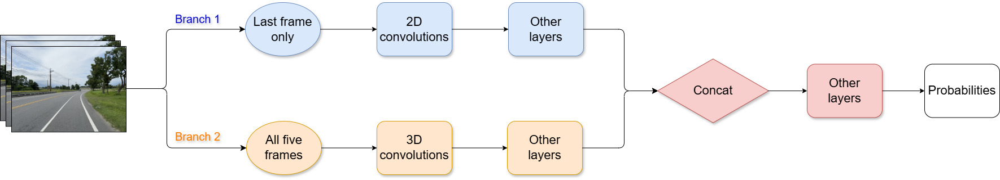
</center>

When building your model, you <b>must</b>

- use a branching architecture,
- use at least one 3D convolutional layer,
- use a Dense layer as your last layer, which outputs 3 values corresponding to the probability of being a left turn, straight or right turn and
- keep your total number of parameters under 10,000,000.

Other than that, you are free to design the model in any way you wish.  You can even change the purpose of the two branches and add layers out of the scope of this course, just as long as they do not require additional library imports.  When designing your model, the following layers may be useful:

- `Conv2D` and `Conv3D`
- `MaxPool2D` and `MaxPool3D`
- `Flatten`
- `Dense`
- `Cropping3D`
- `Reshape`

Complete the function `get_model()` which returns the <b>compiled</b> model.  Some skeleton code is given to help you, but you can delete them and write the function in any way you wish to.  To avoid bugs when building your model, make sure you keep track of the output shape after each layer.

<center>

| function name | parameter name | parameter datatype | return type
|---------------------------------|------------------------------------------|----------------------------|-------------------------------|
| `get_model` <br> | -- | -- | `keras.src.models.functional.Functional` |

</center>

In [ ]:
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#
#-# TASK 4.2:  get_model  #-#
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#

def get_model():
  """
  Compiles and builds a branching CNN model for direction prediction.
  Returns:
    The compiled Keras model
  """
  ### TODO: Your code goes here! ###
  input_layer = layers.Input(shape=(5, 240, 320, 1))

  # simple convolution branch
  branch1 = models.Sequential()
  branch1.add(input_layer)
  branch1.add(???)
  ...
  branch1.add(???)

  # time branch
  branch2 = models.Sequential()
  branch2.add(input_layer)
  branch2.add(???)
  ...
  branch2.add(???)

  # merge two branches
  merged = layers.concatenate([branch1.outputs[0], branch2.outputs[0]])

  # add final layers
  output = layers.Xyz(???)(merged)
  output = layers.Xyz(???)(output)
  ...
  output = layers.Xyz(???)(output)

  # chain up everything from the input layer to the final output
  model = models.Model(input_layer, output)

  optimizer = keras.optimizers.Adam(learning_rate=0.001)
  model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

  if __name__ == "__main__":
    model.summary()

  return model

##### Task 4.3:  Train and test your model!

Now, it is time to train your model.  Fill in the filenames of the videos you want to train with, and format the dataset first.  Depending on how much you vectorized your code, this cell may take a long time to run.  If you want to save the processed result, you can use

```python
np.save("x.npy", x)
np.save("y.npy", y)
```

The files will be saved to the folder icon on the left tab of this Colab notebook.  To load the saved arrays, use

```python
x = np.load("x.npy")
y = np.load("y.npy")
```

You are free to change the code in any of the cells below, just as long as you keep everything under the `if` statement.

<b>Hint:</b> You are given 7 videos to train your model. However, you should not blindly using all of them to train your model. Some of the videos may even ruin your model since they are having bad quality! You should only choose the ones that are good to train your model! As mentioned, always know your data before using them to train your model!

In [ ]:
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#
#-# TASK 4.3:  Train and test your model!   #-#
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#

if __name__ == "__main__":

  ### TODO: Feel free to change the following code! ###

  # get the dataset
  filenames = ["/content/drive/MyDrive/...",
               "/content/drive/MyDrive/...",
               ]
  x, y = format_dataset(filenames, video_to_np)

  np.save("x.npy", x)
  np.save("y.npy", y)

Now, choose an appropriate number of epochs and batch size.  The code will help you save the trained model as `"COMP2211_PA2_Mini_AutoPilot.keras"`.  Refer to the course webpage for information on how to submit your code and model.

In [ ]:
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#
#-# TASK 4.3:  Train and test your model!   #-#
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#
import keras
if __name__ == "__main__":
  x = np.load("x.npy")
  y = np.load("y.npy")
  train_x, test_x, train_y, test_y = train_test_split(x, y, test_size=0.3, random_state=2211)

  # get the model
  if os.path.exists("COMP2211_PA2_Mini_AutoPilot.keras"):
    model = keras.saving.load_model("COMP2211_PA2_Mini_AutoPilot.keras")
  else:
    model = get_model()
  model.fit(x=train_x, y=train_y, epochs=20, batch_size=8, validation_data=(test_x, test_y))

  # test the model
  loss, accuracy = model.evaluate(x=test_x, y=test_y, batch_size=8)
  print(f"loss: {loss}:.3f")
  print(f"accuracy: {accuracy}:.3f")

  # save the model
  model.save("COMP2211_PA2_Mini_AutoPilot.keras")

The following code is provided for you to check the outputs of your model.

In [ ]:
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#
#-# TASK 4.3:  Train and test your model!   #-#
#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#-#

if __name__ == "__main__":
  # load model
  model = models.load_model("COMP2211_PA2_Mini_AutoPilot.keras")

  # choose some instance to check
  instances = [10, 11, 14, 18]

  for i in instances:
    # get the predicted and actual label
    text = lambda label: "left" if label == 0 else "straight" if label == 1 else "right"
    predicted = text(np.argmax(model(test_x[i:i+1]), axis=1))
    actual = text(int(test_y[i]))

    # display the image and results
    plt.imshow(test_x[i, 4])
    plt.show()
    print("predicted: ", predicted)
    print("actual:", actual)
    print("---")

##### The end

Congratulations!  You have reached the end of this assignment.  Even though a lot of work was done, there are still lots of ways to improve the results.

- The lane detection suffers from <b>camera angle</b> and <b>unclear road marking</b> issues.  Is there a way to map the image into an aerial view?
- A lot of <b>hyperparameters</b> were chosen, for example using 175 as a threshold for bright pixels (section 2.1), using 9 bounding boxes (section 2.3) and blackening the top half of the image (section 4.1).  Are there smarter ways to choose these hyperparameters?
- Our simplified model only predicts "left", "straight" or "right".  With more training data and better curvature detection methods, this could be improved.
- 3D convolutions were used to incorporate "time", but are there any better methods?
- The direction vector predicted by the model jumps around quite often.  Are there any ways to smooth out the direction vector?

Regardless, hope you were able to learn a lot from this assignment.  Remember to refer to the grading scheme on the course webpage, and submit your assignment in the correct format and on time.